In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.core.interactiveshell import InteractiveShell
#让所有的变量或者声明都能显示出来
InteractiveShell.ast_node_interactivity = 'all'
import torch

# 预备知识

## Tensor&Variable

**pyTorch0.4.0以后，Variable已经并入张量**
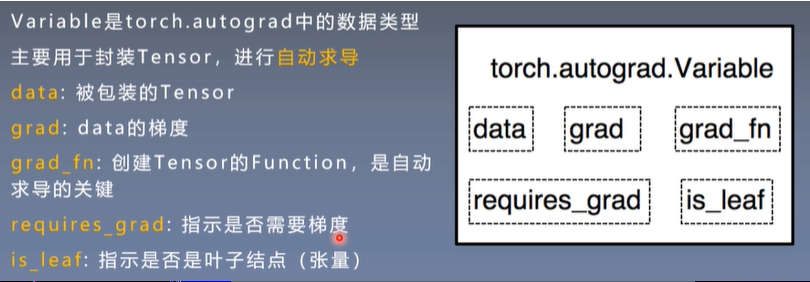

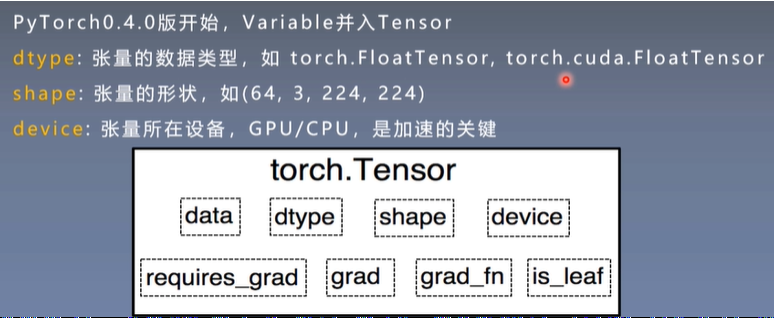

## 张量创建

* 直接创建
* 依据数值创建
* 依据概率创建

### torch.tensor()直接创建

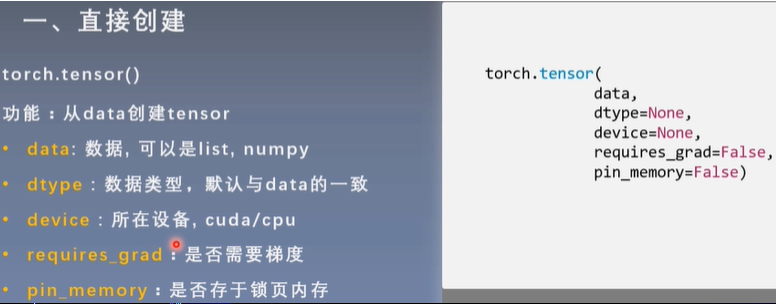

In [2]:
arr = np.ones((3,3))
print("ndarray的数据类型：", arr.dtype)
t = torch.tensor(arr)
t

ndarray的数据类型： float64


tensor([[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]], dtype=torch.float64)

### torch.from_numpy(ndarray)创建

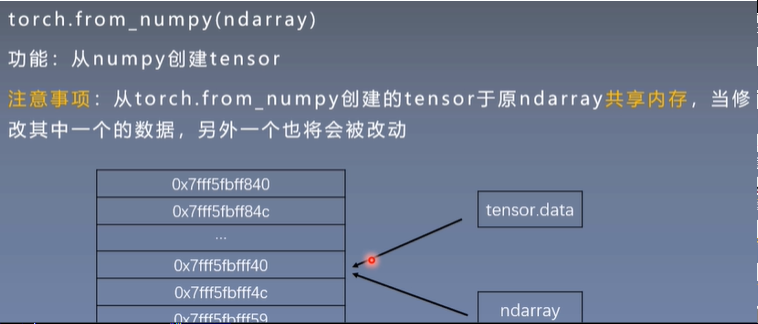

In [3]:
arr = np.ones((3,3))
t = torch.from_numpy(arr)
arr[0,0] = -1
arr
t

t[0,1] = -2
arr
t

array([[-1.,  1.,  1.],
       [ 1.,  1.,  1.],
       [ 1.,  1.,  1.]])

tensor([[-1.,  1.,  1.],
        [ 1.,  1.,  1.],
        [ 1.,  1.,  1.]], dtype=torch.float64)

array([[-1., -2.,  1.],
       [ 1.,  1.,  1.],
       [ 1.,  1.,  1.]])

tensor([[-1., -2.,  1.],
        [ 1.,  1.,  1.],
        [ 1.,  1.,  1.]], dtype=torch.float64)

### 依据数值创建

#### torch.zeros()

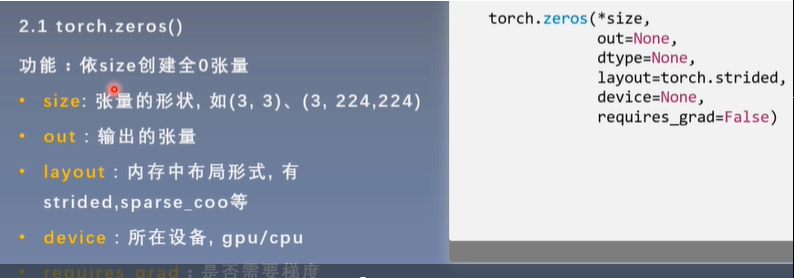

####  torch.zeros_like()

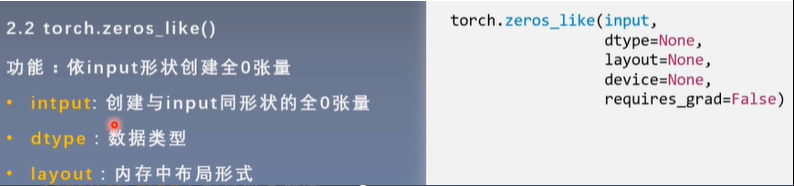

#### torch.ones()/torch.ones_like()

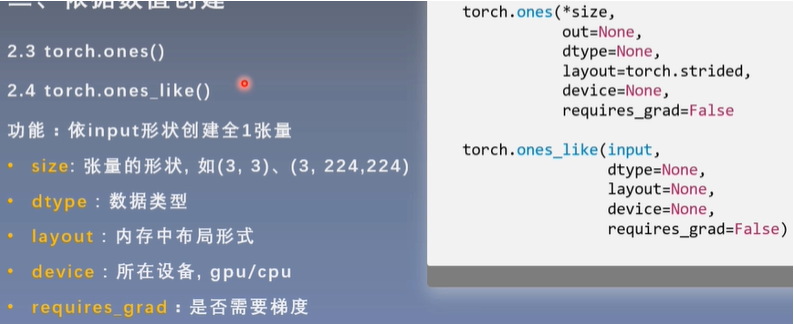


#### torch.full()/torch.full_like()

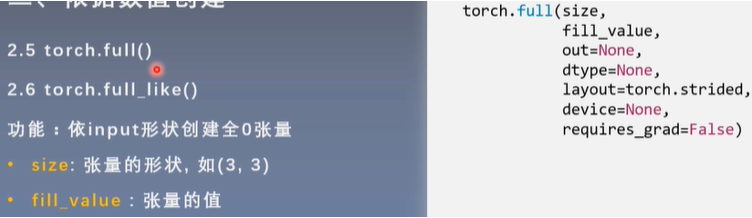

#### torch.arange()

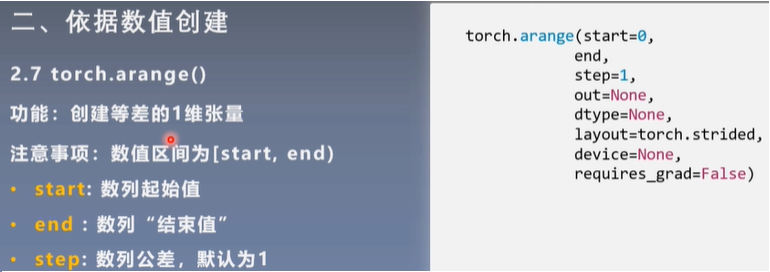

#### torch.linspace()

**步长 = (start-end)/(steps-1)**

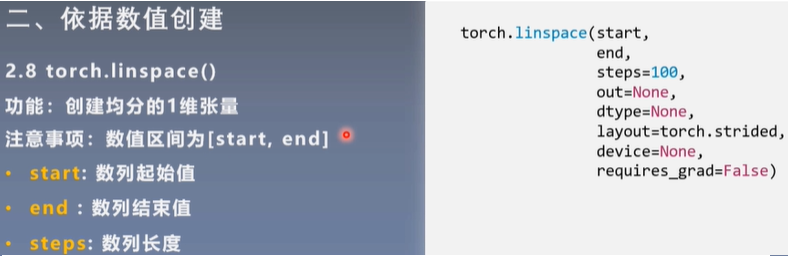

#### torch.logspace()

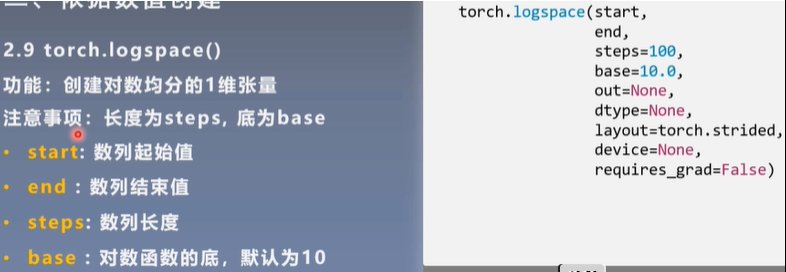

#### torch.eye()

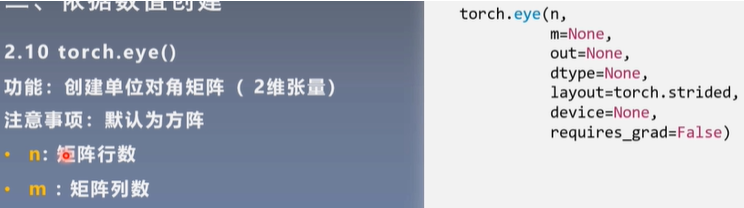

### 依据概率创建

#### torch.normal()

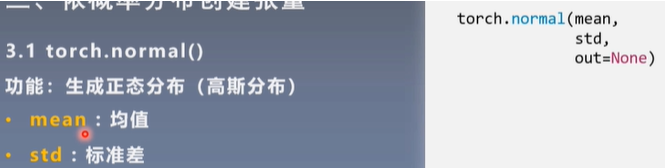

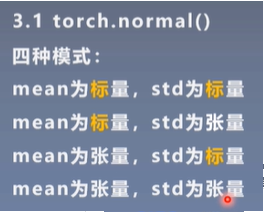

In [3]:
# mean 张量，std:张量
mean = torch.arange(1, 5, dtype=torch.float)
std = torch.arange(1,5,dtype = torch.float)
t_normal = torch.normal(mean, std) 
mean
std
t_normal
# mean 标量，std:标量
t_normal = torch.normal(0.,1.,size=(4,)) #这里需要指定size
t_normal

tensor([1., 2., 3., 4.])

tensor([1., 2., 3., 4.])

tensor([0.6955, 2.5137, 2.6518, 3.3169])

tensor([-0.3655, -1.2086, -1.4962,  2.1676])

#### torch.randn()/torch.randn_like()标准正太分布

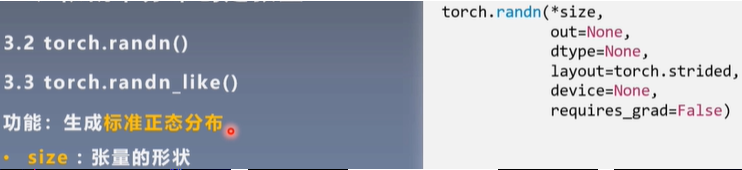

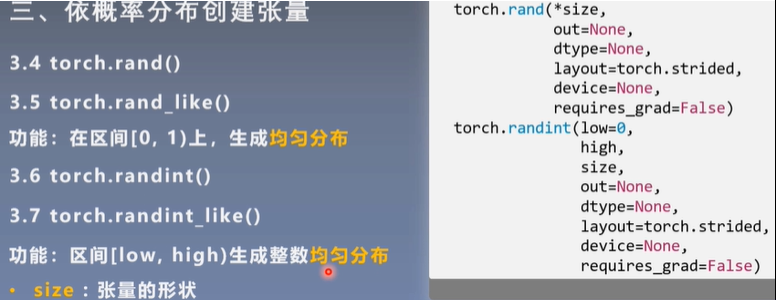

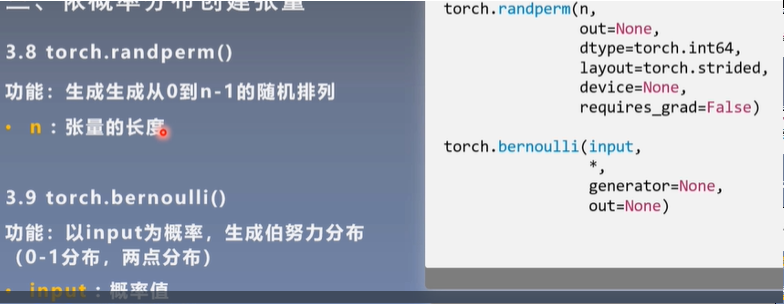

## 张量属性

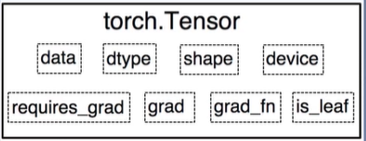

* grad_fn：记录创建该张量时所用的方法；
* is_leaf：可以查看该张量是否为叶子结点
* requires_grad: 如果将tensor属性.requires_grad设置为True，它将开始追踪(track)在其上的所有操作（这样就可以利用链式法则进行梯度传播了）。完成计算后，可以调用.backward()来完成所有梯度计算。此Tensor的梯度将累积到.grad属性中。

## 张量操作

1. 张量的索引与切片
2. 张量的合并与拆分；
3. 张量的形状/维度变换；
4. 张量的数学基础运算——加/减/乘/除等；
5. 张量的线性代数运算
6. 广播机制
7. Tensor和NumPy相互转换
8. 运算的内存开销
9. Tensor on GPU

**PyTorch中的Tensor支持超过一百种操作，包括转置、索引、切片、数学运算、线性代数、随机数等等，可参考[官方文档](https://pytorch.org/docs/stable/tensors.html)。**

### 张量的索引与切片

我们可以使用**类似NumPy的索引**操作来访问Tensor的一部分，需要注意的是：**索引出来的结果与原数据共享内存，也即修改一个，另一个会跟着修改。**

这里不详细介绍，用到了再查官方文档：

函数|	功能
 :-: | :-: |
index_select(input, dim, index)	|在指定维度dim上选取，比如选取某些行、某些列
masked_select(input, mask)|	例子如上，a[a>0]，使用ByteTensor进行选取
nonzero(input) | 非0元素的下标
gather(input, dim, index)|根据index，在dim维度上选取数据，输出的size与index一样



#### torch.index_select()

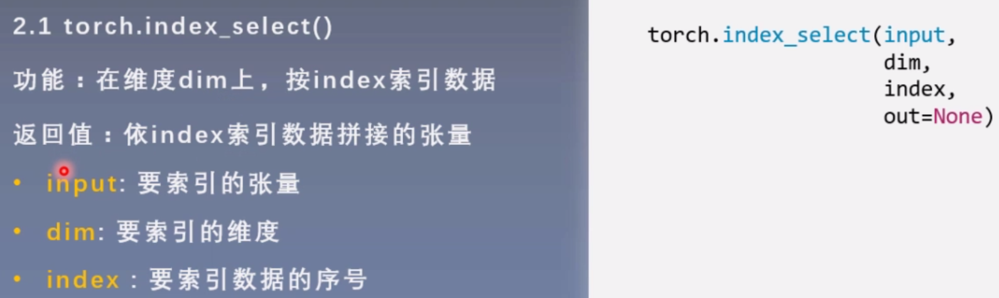

In [2]:
t = torch.randint(0,9,size=(3,3))
idx = torch.tensor([0,2],dtype=torch.long) #float error
t_select = torch.index_select(t,dim=0,index=idx)
t
t_select

tensor([[8, 5, 2],
        [7, 8, 3],
        [0, 0, 0]])

tensor([[8, 5, 2],
        [0, 0, 0]])

#### torch.masked_select()
**返回一维张量**

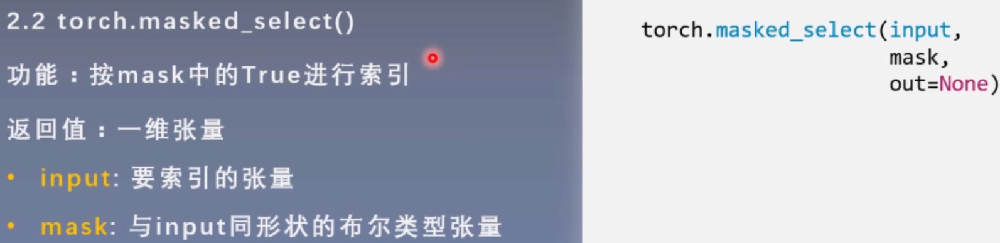

In [3]:
t = torch.randint(0,9,size=(3,3))
mask = t.ge(5) # ge:greater&equal大于等于；gt大于；le小于等于；lt小于
t_select = torch.masked_select(t,mask)
t
mask
t_select

tensor([[2, 8, 2],
        [1, 0, 1],
        [2, 0, 1]])

tensor([[False,  True, False],
        [False, False, False],
        [False, False, False]])

tensor([8])

### 张量的合并与拆分
#### torch.cat()/torch.stack()张量拼接

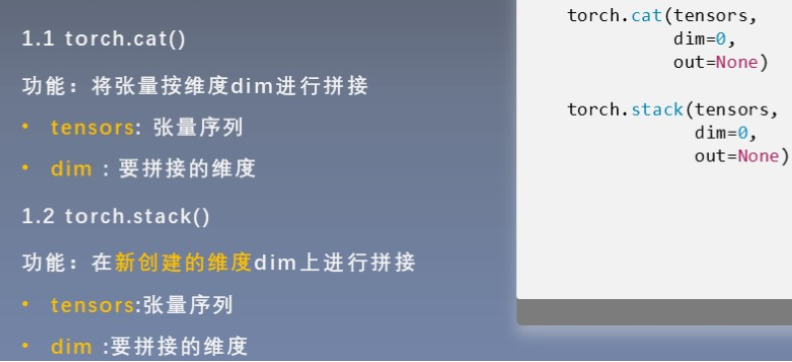

In [8]:
t = torch.ones((2,3))

t_0 = torch.cat([t,t],dim=0)
t_1 = torch.cat([t,t],dim=1)
t_0
t_1

tensor([[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]])

tensor([[1., 1., 1., 1., 1., 1.],
        [1., 1., 1., 1., 1., 1.]])

In [11]:
torch.stack([t,t,t],dim=0)
torch.stack([t,t,t],dim=0).shape

tensor([[[1., 1., 1.],
         [1., 1., 1.]],

        [[1., 1., 1.],
         [1., 1., 1.]],

        [[1., 1., 1.],
         [1., 1., 1.]]])

torch.Size([3, 2, 3])

#### 张量切分——torch.chunk()/torch.split()

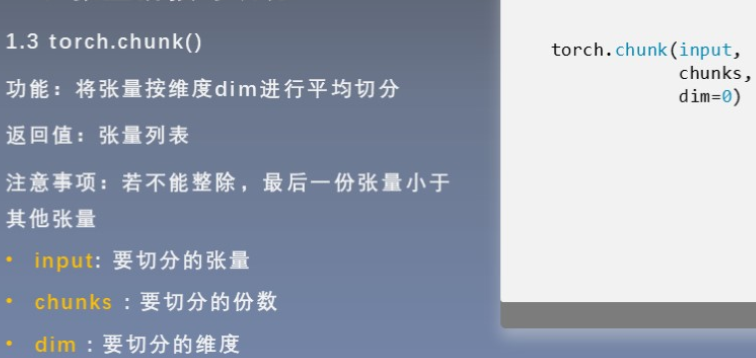

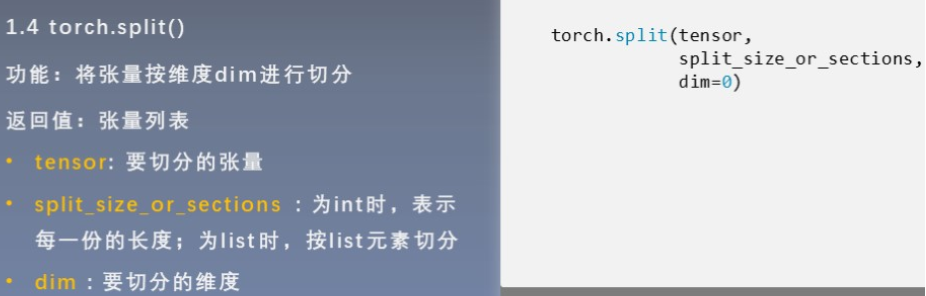

In [14]:
a = torch.ones((2,5))
list_of_tensors = torch.chunk(a, dim=1,chunks=2) #chunck（）向上取整 chunk_size = 5/2=2.5 => 3
for idx,t in enumerate(list_of_tensors):
    print("第{}个张量：{}，shape is {}".format(idx+1,t,t.shape))

第1个张量：tensor([[1., 1., 1.],
        [1., 1., 1.]])，shape is torch.Size([2, 3])
第2个张量：tensor([[1., 1.],
        [1., 1.]])，shape is torch.Size([2, 2])


In [20]:
T = torch.ones((2,5))
list_of_tensors = torch.split(T,2,dim=1)
for idx,t in enumerate(list_of_tensors):
    print("第{}个张量：{}，shape is {}".format(idx+1,t,t.shape))
    
print("\n")    
list_of_tensors = torch.split(T,[2,1,2],dim=1)
for idx,t in enumerate(list_of_tensors):
    print("第{}个张量：{}，shape is {}".format(idx+1,t,t.shape))

第1个张量：tensor([[1., 1.],
        [1., 1.]])，shape is torch.Size([2, 2])
第2个张量：tensor([[1., 1.],
        [1., 1.]])，shape is torch.Size([2, 2])
第3个张量：tensor([[1.],
        [1.]])，shape is torch.Size([2, 1])


第1个张量：tensor([[1., 1.],
        [1., 1.]])，shape is torch.Size([2, 2])
第2个张量：tensor([[1.],
        [1.]])，shape is torch.Size([2, 1])
第3个张量：tensor([[1., 1.],
        [1., 1.]])，shape is torch.Size([2, 2])


### 张量变换:形状变换&维度变换

* 形状变换
    *  torch.reshape()
    *  tensor.view()
注意view()返回的新Tensor与源Tensor虽然可能有不同的size，但是是共享data的，也即更改其中的一个，另外一个也会跟着改变。(顾名思义，view仅仅是改变了对这个张量的观察角度，内部数据并未改变)
所以如果我们想返回一个真正新的副本（即不共享data内存）该怎么办呢？Pytorch还提供了一个reshape()可以改变形状，但是此函数并不能保证返回的是其拷贝，所以不推荐使用。推荐先用clone创造一个副本然后再使用view。

使用clone还有一个好处是会被记录在计算图中，即梯度回传到副本时也会传到源Tensor。

* 维度变/交换
    * 交换张量的两个轴：torch.transpose()/torch.t()
    * 压缩/拓展张量维度：torch.squeeze()/torch.unsqueeze()
    
    
* 它可以将一个标量Tensor转换成一个Python number：item(), 

注：虽然view返回的Tensor与源Tensor是共享data的，但是依然是一个新的Tensor（因为Tensor除了包含data外还有一些其他属性），二者id（内存地址）并不一致。

#### torch.reshape（）
**如果input张量在内存中是连续的，新张量与input共享数据内存**
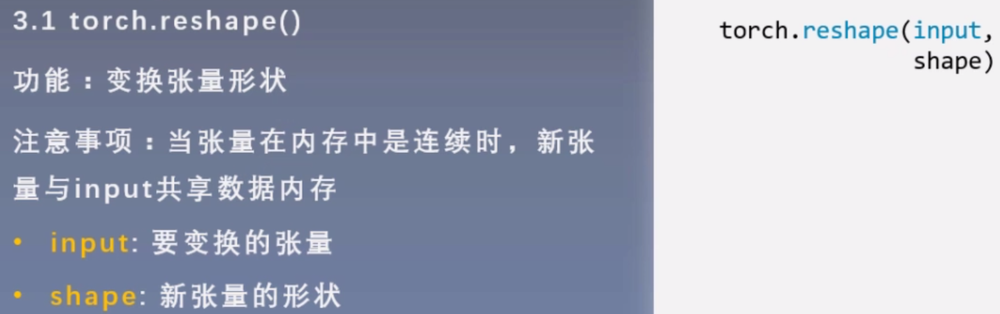

In [7]:
t = torch.randperm(8)
t
t_reshape = torch.reshape(t,(-1,4)) # -1不需要关心，通过其他维度计算后得来
t_reshape

t[0] = 1024
t_reshape
######################
id(t.data)
id(t_reshape.data)

tensor([1, 5, 7, 2, 3, 6, 4, 0])

tensor([[1, 5, 7, 2],
        [3, 6, 4, 0]])

tensor([[1024,    5,    7,    2],
        [   3,    6,    4,    0]])

2476829916840

2476829916840

真正新的副本（即不共享data内存）

In [13]:
x = torch.randperm(8)
x_cp = x.clone().view(2,4)
x -= 1
print(x)
print(x_cp)

tensor([ 6,  4,  0,  3,  1,  5, -1,  2])
tensor([[7, 5, 1, 4],
        [2, 6, 0, 3]])


item():

In [16]:
x = torch.randn(1)
print(x)
print(x.item())

tensor([-0.3158])
-0.3157952129840851


#### torch.transpose()/torch.t()

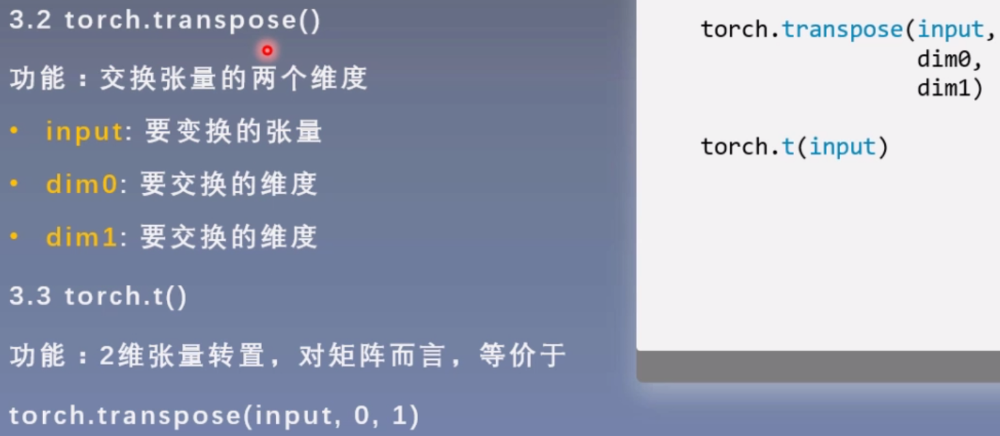

In [9]:
t = torch.rand((2,3,4))
t
t_transpose = torch.transpose(t, dim0=1, dim1=2)
t_transpose
t.shape
t_transpose.shape

tensor([[[0.1588, 0.7554, 0.0545, 0.9482],
         [0.2970, 0.7333, 0.9678, 0.0518],
         [0.2337, 0.7122, 0.9966, 0.7976]],

        [[0.9408, 0.5882, 0.5032, 0.2701],
         [0.8410, 0.7756, 0.5663, 0.0511],
         [0.6994, 0.0997, 0.3450, 0.9285]]])

tensor([[[0.1588, 0.2970, 0.2337],
         [0.7554, 0.7333, 0.7122],
         [0.0545, 0.9678, 0.9966],
         [0.9482, 0.0518, 0.7976]],

        [[0.9408, 0.8410, 0.6994],
         [0.5882, 0.7756, 0.0997],
         [0.5032, 0.5663, 0.3450],
         [0.2701, 0.0511, 0.9285]]])

torch.Size([2, 3, 4])

torch.Size([2, 4, 3])

#### torch.squeeze()/torch.unsqueeze()

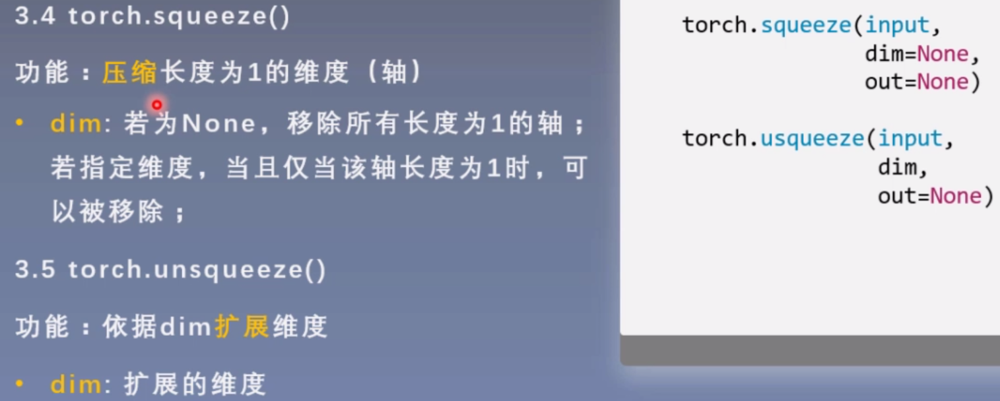

In [11]:
t = torch.rand((1,2,3,1))
t_tq = torch.squeeze(t)
t_0 = torch.squeeze(t,dim=0)
t_1 = torch.squeeze(t,dim=1)

print('t')
t.shape
t
print("-----"*10)
print('t_tq')
t_tq.shape
t_tq
print("-----"*10)
print('t_0')
t_0.shape
print("-----"*10)
print('t_1')
t_1.shape # dim=1时长度不为1

t


torch.Size([1, 2, 3, 1])

tensor([[[[0.0711],
          [0.0122],
          [0.1489]],

         [[0.2756],
          [0.6359],
          [0.3835]]]])

--------------------------------------------------
t_tq


torch.Size([2, 3])

tensor([[0.0711, 0.0122, 0.1489],
        [0.2756, 0.6359, 0.3835]])

--------------------------------------------------
t_0


torch.Size([2, 3, 1])

--------------------------------------------------
t_1


torch.Size([1, 2, 3, 1])

In [2]:
torch.empty(5,3)
torch.rand(5,3)
torch.zeros(5,3,dtype=torch.long)

tensor([[4.1327e-39, 4.4082e-39, 5.1429e-39],
        [4.5000e-39, 8.4489e-39, 1.0102e-38],
        [1.0561e-38, 1.0653e-38, 4.5919e-39],
        [4.4082e-39, 9.9184e-39, 9.0000e-39],
        [1.0561e-38, 1.0653e-38, 4.1327e-39]])

tensor([[0.5767, 0.8310, 0.9491],
        [0.0072, 0.9837, 0.3980],
        [0.1773, 0.0985, 0.1900],
        [0.0066, 0.2469, 0.6493],
        [0.6560, 0.5503, 0.3051]])

tensor([[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]])

In [3]:
x = torch.tensor([5.5,3.0])
x

tensor([5.5000, 3.0000])

In [4]:
x = x.new_ones(5,3,dtype=torch.float64)
x = torch.randn_like(x,dtype=torch.float)

In [5]:
x
y = torch.rand(5,3)
y
x+y
torch.add(x,y)
x.add_(y)

tensor([[-0.4189,  0.6421,  1.1486],
        [ 0.9456, -0.6583,  1.8685],
        [ 1.0371, -1.5211,  1.0346],
        [ 0.5350,  0.1980, -0.1142],
        [ 0.1764, -0.8190, -0.2420]])

tensor([[0.1318, 0.2687, 0.6292],
        [0.7815, 0.1688, 0.5659],
        [0.1376, 0.2960, 0.4832],
        [0.2363, 0.8688, 0.5875],
        [0.2769, 0.3249, 0.8896]])

tensor([[-0.2871,  0.9108,  1.7778],
        [ 1.7271, -0.4896,  2.4343],
        [ 1.1747, -1.2251,  1.5178],
        [ 0.7713,  1.0668,  0.4733],
        [ 0.4533, -0.4941,  0.6476]])

tensor([[-0.2871,  0.9108,  1.7778],
        [ 1.7271, -0.4896,  2.4343],
        [ 1.1747, -1.2251,  1.5178],
        [ 0.7713,  1.0668,  0.4733],
        [ 0.4533, -0.4941,  0.6476]])

tensor([[-0.2871,  0.9108,  1.7778],
        [ 1.7271, -0.4896,  2.4343],
        [ 1.1747, -1.2251,  1.5178],
        [ 0.7713,  1.0668,  0.4733],
        [ 0.4533, -0.4941,  0.6476]])

In [6]:
x.reshape(15)

tensor([-0.2871,  0.9108,  1.7778,  1.7271, -0.4896,  2.4343,  1.1747, -1.2251,
         1.5178,  0.7713,  1.0668,  0.4733,  0.4533, -0.4941,  0.6476])

In [7]:
x

tensor([[-0.2871,  0.9108,  1.7778],
        [ 1.7271, -0.4896,  2.4343],
        [ 1.1747, -1.2251,  1.5178],
        [ 0.7713,  1.0668,  0.4733],
        [ 0.4533, -0.4941,  0.6476]])

## 张量数学运算

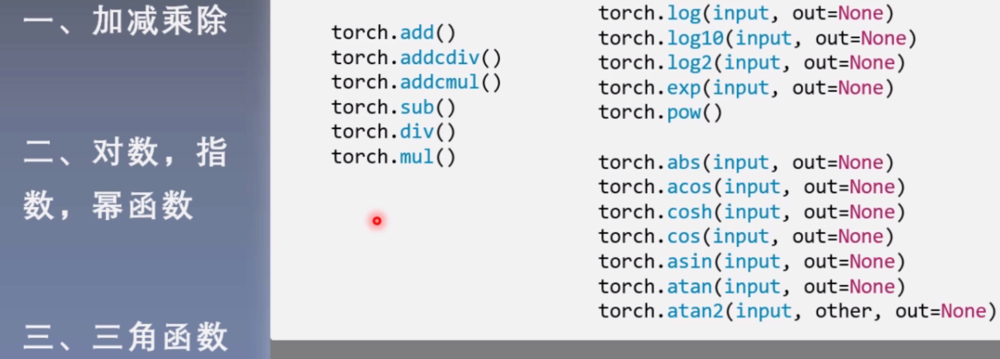

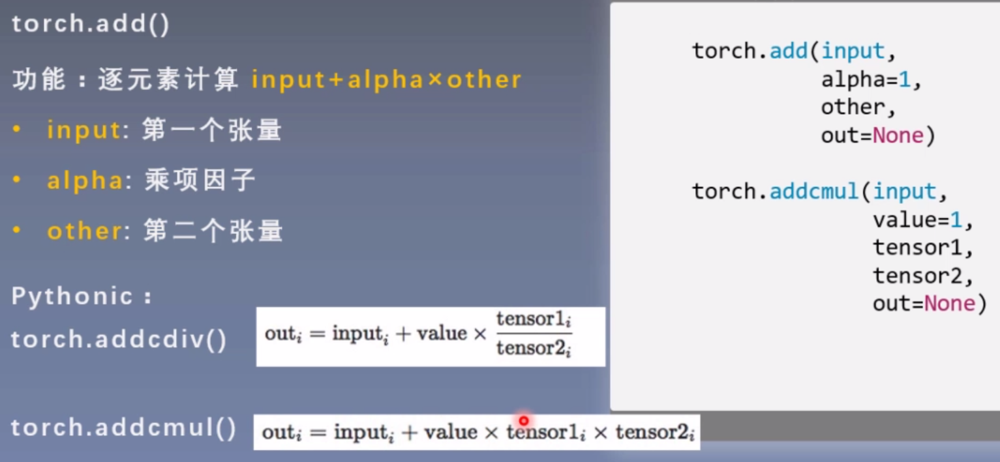

在PyTorch中，同一种操作可能有很多种形式，下面用加法作为例子。

In [8]:
x = x.new_ones(5, 3, dtype=torch.float64)  # 返回的tensor默认具有相同的torch.dtype和torch.device
x = torch.randn_like(x, dtype=torch.float) # 指定新的数据类型

y = torch.rand(5, 3)
print(x + y)

print(torch.add(x, y))

result = torch.empty(5, 3)
torch.add(x, y, out=result)
print(result)


# adds x to y inplace
y.add_(x)
print(y)


tensor([[ 1.8871,  0.2953,  1.2263],
        [ 1.3615, -0.2527, -0.7331],
        [-1.8997, -0.2690, -0.3379],
        [ 0.8469,  1.0000,  0.3695],
        [-1.2535,  1.7306,  1.3716]])
tensor([[ 1.8871,  0.2953,  1.2263],
        [ 1.3615, -0.2527, -0.7331],
        [-1.8997, -0.2690, -0.3379],
        [ 0.8469,  1.0000,  0.3695],
        [-1.2535,  1.7306,  1.3716]])


tensor([[ 1.8871,  0.2953,  1.2263],
        [ 1.3615, -0.2527, -0.7331],
        [-1.8997, -0.2690, -0.3379],
        [ 0.8469,  1.0000,  0.3695],
        [-1.2535,  1.7306,  1.3716]])

tensor([[ 1.8871,  0.2953,  1.2263],
        [ 1.3615, -0.2527, -0.7331],
        [-1.8997, -0.2690, -0.3379],
        [ 0.8469,  1.0000,  0.3695],
        [-1.2535,  1.7306,  1.3716]])


tensor([[ 1.8871,  0.2953,  1.2263],
        [ 1.3615, -0.2527, -0.7331],
        [-1.8997, -0.2690, -0.3379],
        [ 0.8469,  1.0000,  0.3695],
        [-1.2535,  1.7306,  1.3716]])

tensor([[ 1.8871,  0.2953,  1.2263],
        [ 1.3615, -0.2527, -0.7331],
        [-1.8997, -0.2690, -0.3379],
        [ 0.8469,  1.0000,  0.3695],
        [-1.2535,  1.7306,  1.3716]])


## 张量的线性代数运算

函数	|功能
 :-: | :-: |
trace	|对角线元素之和(矩阵的迹)
diag	|对角线元素
triu/tril	|矩阵的上三角/下三角，可指定偏移量
mm/bmm	|矩阵乘法，batch的矩阵乘法
addmm/addbmm/addmv/addr/baddbmm..	|矩阵运算
t	|转置
dot/cross	|内积/外积
inverse	|求逆矩阵
svd	|奇异值分解

## 张量运算的开销

索引操作是不会开辟新内存的，而像y = x + y这样的运算是会新开内存的，然后将y指向新内存。为了演示这一点，我们可以使用Python自带的id函数：如果两个实例的ID一致，那么它们所对应的内存地址相同；反之则不同。

In [4]:
x = torch.tensor([1, 2])
y = torch.tensor([3, 4])
id_before = id(y)
y = y + x
print(id(y) == id_before) # False 


False


**减少内存开销的方法:**

* [:]
* 运算符全名函数中的out参数或者自加运算符+=(也即add_())达到上述效果，例如torch.add(x, y, out=y)和y += x or y.add_(x)。

In [5]:
x = torch.tensor([1, 2])
y = torch.tensor([3, 4])
id_before = id(y)
torch.add(x, y, out=y) # y += x, y.add_(x)
print(id(y) == id_before) # True


tensor([4, 6])

True


## Tensor和NumPy相互转换

### Tensor转为numpy——.numpy():共享内存


In [2]:
a = torch.ones(5)
b = a.numpy()
print(a, b)

a += 1
print(a, b)
b += 1
print(a, b)


tensor([1., 1., 1., 1., 1.]) [1. 1. 1. 1. 1.]
tensor([2., 2., 2., 2., 2.]) [2. 2. 2. 2. 2.]
tensor([3., 3., 3., 3., 3.]) [3. 3. 3. 3. 3.]


### numpy转为tensor

* from_numpy()：共享内存；
* torch.tensor()：此方法总是会进行数据拷贝（就会消耗更多的时间和空间），所以返回的Tensor和原来的数据不再共享内存。

In [3]:
#共享内存
a = np.ones(5)
b = torch.from_numpy(a)
print(a, b)
a += 1
print(a, b)
b += 1
print(a, b)

#生成拷贝
c = torch.tensor(a)
a += 1
print(a, c)


[1. 1. 1. 1. 1.] tensor([1., 1., 1., 1., 1.], dtype=torch.float64)
[2. 2. 2. 2. 2.] tensor([2., 2., 2., 2., 2.], dtype=torch.float64)
[3. 3. 3. 3. 3.] tensor([3., 3., 3., 3., 3.], dtype=torch.float64)
[4. 4. 4. 4. 4.] tensor([3., 3., 3., 3., 3.], dtype=torch.float64)


## Tensor on GPU

用方法to()可以将Tensor在CPU和GPU（需要硬件支持）之间相互移动。

In [ ]:
# 以下代码只有在PyTorch GPU版本上才会执行
if torch.cuda.is_available():
    device = torch.device("cuda")          # GPU
    y = torch.ones_like(x, device=device)  # 直接创建一个在GPU上的Tensor
    x = x.to(device)                       # 等价于 .to("cuda")
    z = x + y
    print(z)
    print(z.to("cpu", torch.double))       # to()还可以同时更改数据类型

# 计算图

计算图：用来描述运算的有向无环图

元素：
1. 结点(Node)：表示数据，张量
2. 边(Edge)：表示运算，加减乘除等

静态计算图和动态计算图 
计算图的构建可以分为静态计算图和动态计算图。
* 静态计算图是在编译时构建计算图，计算图构建好之后在程序运行时不能改变(以Tensorflow1.x为代表)；
* 动态计算图是在程序运行时动态构建(以Tensorflow2.x/PyTorch为代表)。

两种构建方式各有优缺点。静态计算图在构建时可以进行优化，并行能力强，但灵活性比较差。动态计算图则不容易优化，当不同输入的网络结构不一致时，难以并行计算，但是灵活性比较高。

Tensorflow1.x 静态图机制
![Tensorflow 静态图机制](https://www.tensorflow.org/images/tensors_flowing.gif)

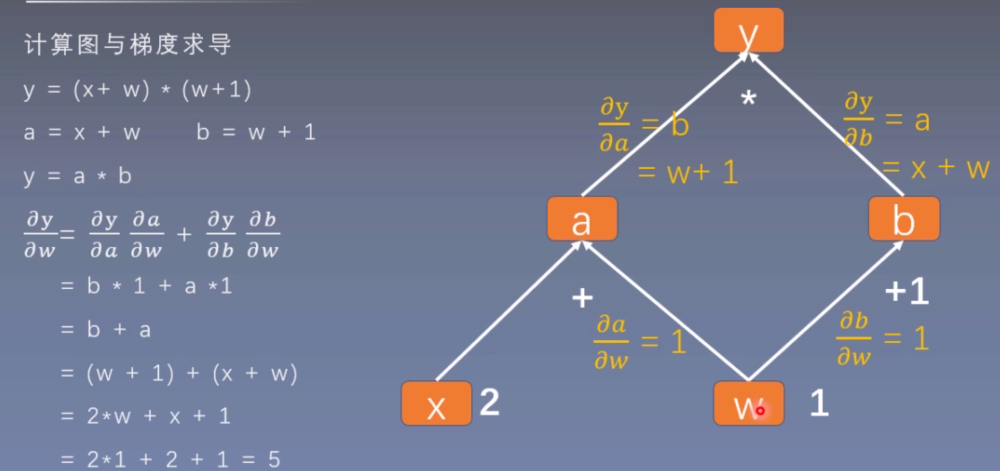

## 计算图的叶子结点

用户创建的结点（requires_grad = True）称为叶子结点，如上图的X和W。
Tensor中有`is_leaf`属性可以查看该张量是否为叶子结点。

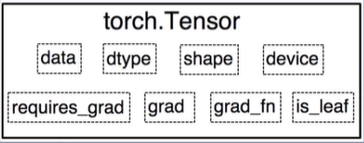

设立计算图的叶子结点的原因：
为了节省内存，**非叶子节点的梯度在反向传播后被释放掉以节省内存**

In [2]:
w = torch.tensor([1.], requires_grad = True)
x = torch.tensor([2.], requires_grad = True)

a = x+w
a.retain_grad() # 非叶子结点，保留此节点的梯度
b = w+1
y = a*b

y.backward()
w.grad

print("is leaf:",w.is_leaf,x.is_leaf,a.is_leaf,b.is_leaf,y.is_leaf)
print('-----'*15)
print("gradient:",w.grad,x.grad,a.grad,b.grad,y.grad) 
print('-----'*15)
print("grad_fn:",w.grad_fn,x.grad_fn,a.grad_fn,b.grad_fn,y.grad_fn)
print('-----'*15)
print("requires_grad:",w.requires_grad,x.requires_grad,a.requires_grad,b.requires_grad,y.requires_grad)

tensor([5.])

is leaf: True True False False False
---------------------------------------------------------------------------
gradient: tensor([5.]) tensor([2.]) tensor([2.]) None None
---------------------------------------------------------------------------
grad_fn: None None <AddBackward0 object at 0x000002A236751488> <AddBackward0 object at 0x000002A23CE0AA88> <MulBackward0 object at 0x000002A23CE0AAC8>
---------------------------------------------------------------------------
requires_grad: True True True True True


D:\0-Anaconda3\envs\tf2.0\lib\site-packages\torch\tensor.py:746: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations.
  warnings.warn("The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad "


# autograd——自动求导系统

## **torch.autograd.backward:(**与tensor.backward()一样**)**
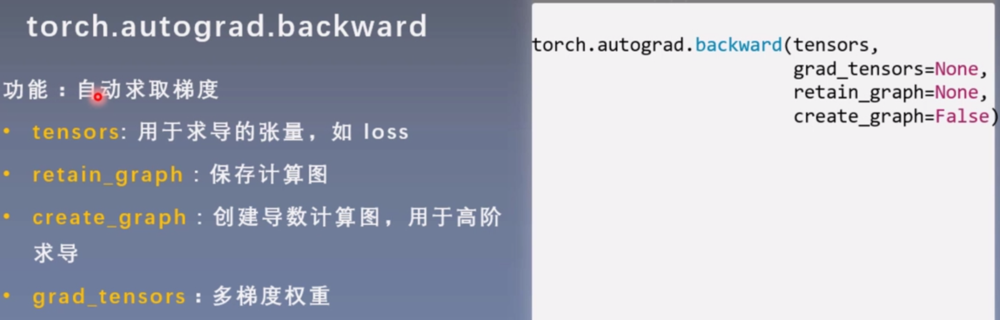

* retain_graph: pytorch在计算一次反向传播时就把计算图删了，如果想保留计算图需要在第一次反向传播时加入`retain_graph=True`
* grad_tensors: 当有多个loss时，需要给每个loss一个权重

注意：在y.backward()时，如果y是标量，则不需要为backward()传入任何参数；否则，需要传入一个与y同形的Tensor。

为什么在y.backward()时，如果y是标量，则不需要为backward()传入任何参数；否则，需要传入一个与y同形的Tensor? 简单来说就是为了避免向量（甚至更高维张量）对张量求导，而转换成标量对张量求导。举个例子，假设形状为 m x n 的矩阵 X 经过运算得到了 p x q 的矩阵 Y，Y 又经过运算得到了 s x t 的矩阵 Z。那么按照前面讲的规则，dZ/dY 应该是一个 s x t x p x q 四维张量，dY/dX 是一个 p x q x m x n的四维张量。问题来了，怎样反向传播？怎样将两个四维张量相乘？？？这要怎么乘？？？就算能解决两个四维张量怎么乘的问题，四维和三维的张量又怎么乘？导数的导数又怎么求，这一连串的问题，感觉要疯掉…… 为了避免这个问题，**我们不允许张量对张量求导，只允许标量对张量求导，求导结果是和自变量同形的张量**。所以必要时我们要把张量通过将所有张量的元素加权求和的方式转换为标量，举个例子，**假设y由自变量x计算而来，w是和y同形的张量，则y.backward(w)的含义是：先计算l = torch.sum(y * w)，则l是个标量，然后求l对自变量x的导数。**

`retain_graph`参数的作用：

In [3]:
w = torch.tensor([1.], requires_grad = True)
x = torch.tensor([2.], requires_grad = True)

a = x+w

b = w+1
y = a*b

y.backward() #执行的就是torch.autograd.backward
w.grad
y.backward()#执行第二次反向传播

tensor([5.])

RuntimeError: Trying to backward through the graph a second time, but the buffers have already been freed. Specify retain_graph=True when calling backward the first time.

In [4]:
w = torch.tensor([1.], requires_grad = True)
x = torch.tensor([2.], requires_grad = True)

a = x+w

b = w+1
y = a*b

y.backward(retain_graph=True)
w.grad
y.backward() #执行第二次反向传播

tensor([5.])

`grad_tensors`的作用（`torch.autograd.backward`中的`grad_tensors`相当于`tensor.backward()`中的`gradient`）

In [3]:
w = torch.tensor([1.], requires_grad = True)
x = torch.tensor([2.], requires_grad = True)

a = x+w
b = w+1
y0 = a*b
y1 = a+b

loss = torch.cat([y0,y1],dim=0)
grad_tensors = torch.tensor([1.,2.]) # y0的梯度乘以1，y1的梯度乘以2

loss.backward(gradient=grad_tensors) #gradient传入torch.autograd.backward()中的grad_tensors
w.grad


tensor([9.])

## torch.autograd.grad(求取梯度)

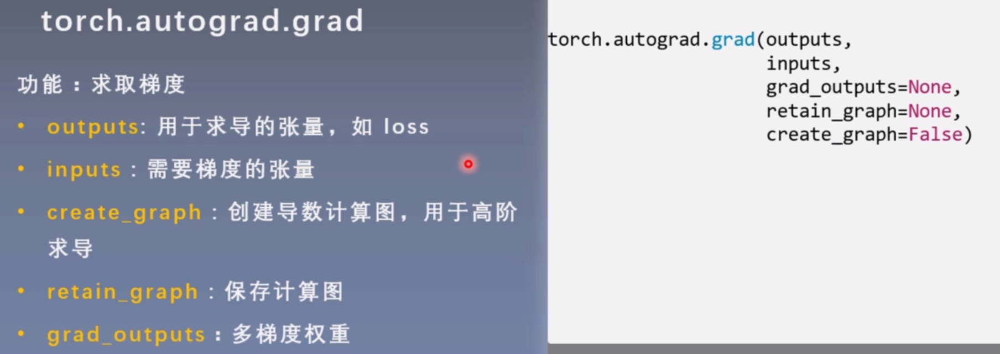

In [4]:
x = torch.tensor([3.],requires_grad = True)
y = torch.pow(x,2) # y = x**2

grad1 = torch.autograd.grad(y,x,create_graph=True) # grad1 = dy/dx = 2x = 6
grad1 # 是一个元组

grad2 = torch.autograd.grad(grad1[0],x) # grad2 = 2
grad2

(tensor([6.], grad_fn=<MulBackward0>),)

(tensor([2.]),)

**自动求导系统需要注意：**

* 1. 梯度不自动清零；
* 2. 依赖于叶子节点的节点(指的是中间节点)，requires_grad默认为True;
* 3. 叶子节点不可执行in-place

梯度不自动清零,在每次梯度下降时，要手动清零：

In [6]:
w = torch.tensor([1.], requires_grad = True)
x = torch.tensor([2.], requires_grad = True)
for i in range(2):    
    a = x+w
    b = w+1
    y = a*b
    
    y.backward()
    print(w.grad)
    _ = w.grad.zero_() #将w的梯度手动清零 #in-place

tensor([5.])
tensor([5.])


依赖于叶子节点的节点(指的是中间节点)，requires_grad默认为True：

In [5]:
w = torch.tensor([1.],requires_grad = True)
x = torch.tensor([2.],requires_grad = True)

a = torch.add(w,x)
b = torch.add(w,1)
y = a*b

a.requires_grad
b.requires_grad
y.requires_grad

True

True

True

叶子节点不可执行in-place

**由于在求解梯度时要根据叶子结点的内存地址索引叶子结点的值，所以不允许在叶子结点上做in-place操作**

In [6]:
w = torch.tensor([1.],requires_grad = True)
x = torch.tensor([2.],requires_grad = True)

a = torch.add(w,x)
b = torch.add(w,1)
y = a*b

w.add_(1)
y.backward()

RuntimeError: a leaf Variable that requires grad is being used in an in-place operation.

### in-place操作
在原始内存中改变数据



In [5]:
a = torch.ones((1,))
print(id(a),a)

a = a+torch.ones((1,))
print(id(a),a)

# in-place
a += torch.ones((1,))
print(id(a),a)

2650304321080 tensor([1.])
2650302751512 tensor([2.])
2650302751512 tensor([3.])


## 中断梯度追踪的例子

如果不想要被继续追踪，可以调用`.detach()`将其从追踪记录中分离出来，这样就可以防止将来的计算被追踪，这样梯度就传不过去了。此外，还可以用`with torch.no_grad()`将不想被追踪的操作代码块包裹起来，这种方法在评估模型的时候很常用，因为在评估模型时，我们并不需要计算可训练参数（`requires_grad=True`）的梯度。

In [7]:
x = torch.tensor(1.0, requires_grad=True)
y1 = x ** 2 
with torch.no_grad():
    y2 = x ** 3
y3 = y1 + y2

print(x.requires_grad)
print(y1, y1.requires_grad) # True
print(y2, y2.requires_grad) # False
print(y3, y3.requires_grad) # True


True
tensor(1., grad_fn=<PowBackward0>) True
tensor(1.) False
tensor(2., grad_fn=<AddBackward0>) True


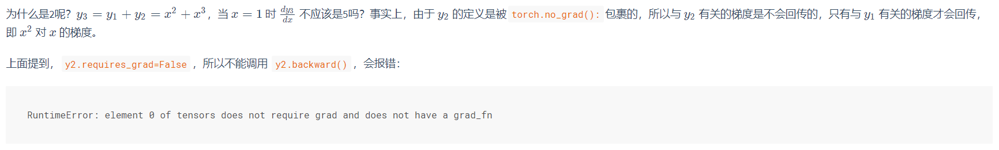

In [8]:
y3.backward()
print(x.grad)


tensor(2.)


## 如果我们想要修改tensor的数值，但是又不希望被autograd记录（即不会影响反向传播），那么我么可以对tensor.data进行操作

In [9]:
x = torch.ones(1,requires_grad=True)

print(x.data) # 还是一个tensor
print(x.data.requires_grad) # 但是已经是独立于计算图之外

y = 2 * x
x.data *= 100 # 只改变了值，不会记录在计算图，所以不会影响梯度传播

y.backward()
print(x) # 更改data的值也会影响tensor的值
print(x.grad)


tensor([1.])
False
tensor([100.], requires_grad=True)
tensor([2.])
